#Model

##Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!cp -r /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/* . # Ignore this line if you have the notebook in the working directory

In [3]:
import numpy as np
import glob
import tensorflow as tf
from tensorflow.python.ops import control_flow_ops
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import librosa
from librosa.display import waveplot, specshow
import soundfile as sf
import IPython.display
from IPython.display import display
import seaborn as sns

In [4]:
from keras.layers import Input, Dense, Lambda, Flatten, Reshape, Layer
from keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D
from keras.models import Model, load_model
from keras import backend as K
from keras.callbacks import TensorBoard, Callback, EarlyStopping, ReduceLROnPlateau

from keras import metrics
from sklearn.utils import shuffle
from scipy.stats import norm
import keras
from tensorflow.python.framework.ops import disable_eager_execution

disable_eager_execution()

## Data Loading

In [7]:
# Chunking parameters
sr = 22050
n_fft = 2048
hop_size = n_fft // 8
n_bins = 128
chunk_size = 24
duration = chunk_size * hop_size / sr
print('creating chunks of length ', duration, ' seconds')
chunk_size_wav = int(sr * duration)

feature = 'stft'
use_phase = False

creating chunks of length  0.2786394557823129  seconds


In [8]:
class DataFrame:
    pass

def get_song(filename):
    df = DataFrame()
    df.Wave = []
    df.Magnitude = []
    df.Phase = []
    try:
        audio, _ = librosa.load(filename, sr=sr)
        if feature == 'stft':
            s = librosa.stft(audio, n_fft=n_fft-1, hop_length=hop_size)
        if feature == 'cqt':
            s = librosa.cqt(audio, n_bins=n_bins, hop_length=hop_size)
        if feature == 'mel':
            s = librosa.feature.melspectrogram(audio, n_fft=n_fft, hop_length=hop_size, n_mels=n_bins)

        n_contextWin = s.shape[1]
        indices = np.arange(chunk_size, s.shape[1], chunk_size)
        indices_wav = np.arange(chunk_size_wav, audio.shape[0], chunk_size_wav)
        s = np.split(s, indices_or_sections=indices, axis=1)
        audio = np.split(audio, indices_or_sections=indices_wav, axis=0)
        s = np.stack([x_i for x_i in s if x_i.shape[1] == chunk_size], axis=0)
        audio = np.stack([x_i for x_i in audio if x_i.shape[0] == chunk_size_wav], axis=0)
        num_chunks = min(s.shape[0], audio.shape[0])
        s = s[:num_chunks,:,:]
        audio = audio[:num_chunks,:]

        if feature is 'stft' or feature is 'cqt': mag = librosa.amplitude_to_db(np.absolute(s))
        if feature is 'mel': mag = librosa.power_to_db(s, ref=np.max)
        pha = np.angle(s)

        df.Wave += list(audio)
        df.Magnitude += list(mag)
        df.Phase += list(pha)
    except Exception as e:
        raise e
    return df

def get_songs(dbdir):
    files = glob.glob(('{}/*.wav*').format(dbdir))
    df = DataFrame()
    df.Wave = []
    df.Magnitude = []
    df.Phase = []
    for f in tqdm(files):
        print(f)
        try:
            _df = get_song(f)

            df.Wave += _df.Wave
            df.Magnitude += _df.Magnitude
            df.Phase += _df.Phase
        except Exception as e:
            raise e
    return df


def audio_recon(mag,phi=None):
    if feature == 'mel':
        mag = librosa.db_to_power(mag)
    else:
        mag = librosa.db_to_amplitude(mag)
    if phi is not None:
        phi = np.cos(phi) + 1j*np.sin(phi)
        if feature == 'stft':
            wav = librosa.istft(mag*phi, hop_length=hop_size) 
        if feature == 'cqt':
            wav = librosa.icqt(mag*phi, hop_length=hop_size) 
    else:
        if feature == 'stft':
            wav = librosa.griffinlim(mag, hop_length=hop_size)
        if feature == 'cqt':
            wav = librosa.griffinlim_cqt(mag, hop_length=hop_size)
        if feature == 'mel':
            wav = librosa.feature.inverse.mel_to_audio(mag, sr=sr, n_fft=n_fft, hop_length=hop_size)
    return wav

def merge_df(dfs):
    df = DataFrame()
    df.Wave = []
    df.Magnitude = []
    df.Phase = []
    for d in dfs:
      df.Wave += d.Wave
      df.Magnitude += d.Magnitude
      df.Phase += d.Phase
    return df
    

def show_spectrogram(s):
    librosa.display.specshow(s,sr=sr)

In [9]:
song_file_1 = "audio/flute/Nanguan - Dongxiao.wav"
df_1 = get_song(song_file_1)
#song_file_2 = "audio/flute/Shakuhachi - Flute.wav"
#df_2 = get_song(song_file_2)
#song_file_3 = "audio/flute/Teleman - Flute.wav"
#df_3 = get_song(song_file_3)
#song_file_4 = "audio/flute/Teleman - Recorder.wav"
#df_4 = get_song(song_file_4)
#song_file_5 = "audio/flute/Bach - Flute.wav"
#df_5 = get_song(song_file_5)

In [11]:
# preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def preprocess(df):
    ## Magnitude Data - Scale to Norm 1
    # Train Scaler
    xm_data = np.array(df.Magnitude)
    normsc = np.hstack(xm_data)
    mscaler = MinMaxScaler().fit(normsc.T)

    # Transform Data using Scaler
    xm_data = [mscaler.transform(arr.T).T for arr in xm_data]
    xm_data = np.dstack(xm_data).transpose(2,0,1)
    xm_data = xm_data[...,None]         # Add singleton class

    ## Phase Data - Scale to Norm 1
    # Train Scaler
    xp_data = np.array(df.Phase)
    normsc = np.hstack(xp_data)
    pscaler = MinMaxScaler().fit(normsc.T)

    # Transform Data using Scaler
    xp_data = [pscaler.transform(arr.T).T for arr in xp_data]
    xp_data = np.dstack(xp_data).transpose(2,0,1)
    xp_data = xp_data[...,None]
    return xm_data, xp_data, mscaler, pscaler

def postprocess(ymag, yphi, mscaler, pscaler):
    yyp = None
    yym = ymag.squeeze()
    if use_phase: yyp = yphi.squeeze()

    yym = mscaler.inverse_transform(yym.T).T
    if use_phase: yyp = pscaler.inverse_transform(yyp.T).T
    return yym, yyp

df = merge_df([df_1])
xm_data, xp_data, mscaler, pscaler = preprocess(df)
#xm_data_t, xp_data_t, mscaler_t, pscaler_t = preprocess(df_test)
num_samples = len(df.Magnitude)


### Quick check on the training data

sample clip:


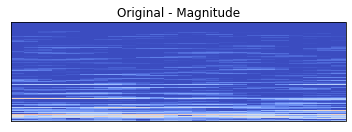

In [ ]:
k = np.random.randint(0,len(xm_data))

xxm, xxp = postprocess(xm_data[k], xp_data[k], mscaler, pscaler)

plt.subplot(221 if use_phase else 211)
show_spectrogram(xxm)
plt.title('Original - Magnitude')
if use_phase:
    plt.subplot(222)
    show_spectrogram(xxp)
    plt.title('Original - Phase')

print('sample clip:')
display(IPython.display.Audio(data=audio_recon(xxm,xxp if feature is not 'mel' else None), rate=sr))

## Creating a VAE

###Defining VAE Model

In [12]:
chns, rows, cols = 1, df.Magnitude[0].shape[0], df.Magnitude[0].shape[1]
filters = 32

batch_size = 50
latent_dim = 100
middle_dim = 1000 # Not really used if phase is not used


epochs = 250

beta_max = 10
start_time = 0 * num_samples
ramp_time = 1 * num_samples
cycle_time = 5 * num_samples
num_cycles = 5

epsilon_std = 1.0
img_size = (rows,cols,chns)
img_size_reduced = rows // 8, cols // 12

tag = 'TelemanF_'
ckptfilename = tag + feature + str(n_fft if feature == 'stft' else n_bins) + 't'+str(epochs)+'h'+str(latent_dim)+'.h5'

In [13]:
# =============================== Q(z|X) ======================================
x_mag = Input(shape=img_size,name='magnitude')
x_phi = Input(shape=img_size,name='phase')

# Mag Encoder
mconv1 = Conv2D(3*filters,(3,5),padding='same',activation='relu',strides=(2,3))(x_mag)
mconv2 = Conv2D(2*filters,(3,3),padding='same',activation='relu',strides=(1,1))(mconv1)
mconv3 = Conv2D(2*filters,(3,3),padding='same',activation='relu',strides=(1,1))(mconv2)
mpool1 = MaxPooling2D((2, 2), padding='same')(mconv3)
mconv4 = Conv2D(filters,(3,3),padding='same',activation='relu',strides=(1,1))(mpool1)
mconv5 = Conv2D(filters,(3,3),padding='same',activation='relu',strides=(1,1))(mconv4)
mpool2 = MaxPooling2D((2, 2), padding='same')(mconv5)
mconv  = Flatten()(mpool2)

# Phi Encoder
pconv1 = Conv2D(3*filters,(3,5),padding='same',activation='relu',strides=(2,3))(x_phi)
pconv2 = Conv2D(2*filters,(3,3),padding='same',activation='relu',strides=(1,1))(pconv1)
pconv3 = Conv2D(2*filters,(3,3),padding='same',activation='relu',strides=(1,1))(pconv2)
ppool1 = MaxPooling2D((2, 2), padding='same')(pconv3)
pconv4 = Conv2D(filters,(3,3),padding='same',activation='relu',strides=(1,1))(ppool1)
pconv5 = Conv2D(filters,(3,3),padding='same',activation='relu',strides=(1,1))(pconv4)
ppool2 = MaxPooling2D((2, 2), padding='same')(pconv5)
pconv  = Flatten()(ppool2)


# Intermediate Shared Layer - Encoder
shared_layer = Dense(middle_dim, activation='relu')
encoded_m = shared_layer(mconv)
encoded_p = shared_layer(pconv)
# encoded   = K.concatenate([encoded_m, encoded_p], axis=-1)
encoded   = keras.layers.concatenate([encoded_m, encoded_p])

# Latent Distribution
z_mean = Dense(latent_dim)(encoded if use_phase else mconv)
z_lvar = Dense(latent_dim)(encoded if use_phase else mconv)

In [14]:
# =============================== Sampling ======================================
def sampling(args):
    z_mean, z_lvar = args
    bsize = K.shape(z_mean)[0]
    epsilon = K.random_normal(shape=(bsize, latent_dim),
                              mean=0.0, stddev=epsilon_std)
    return z_mean + K.exp(z_lvar / 2) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_lvar])

In [15]:
# =============================== P(X|z) ======================================
latent_inputs = keras.Input(shape=(latent_dim,), name='z_sampling')

# Intermediate Shared Layer - Decoder
decode_h = Dense(middle_dim, activation='relu')

# Mag Decoder
decode_m   = decode_h(latent_inputs)
upsample_m = Dense(filters*img_size_reduced[0]*img_size_reduced[1], activation='relu')(decode_m if use_phase else latent_inputs)
ureshape_m = Reshape((img_size_reduced[0],img_size_reduced[1],filters))(upsample_m)
trconv1_m  = Conv2DTranspose(filters,3,padding='same', activation='relu',strides=1)(ureshape_m)
upsamp1_m  = UpSampling2D((2, 2))(trconv1_m)
trconv2_m  = Conv2DTranspose(filters,3,padding='same', activation='relu',strides=1)(upsamp1_m)
trconv3_m  = Conv2DTranspose(2*filters,3,padding='same', activation='relu',strides=1)(trconv2_m)
upsamp2_m  = UpSampling2D((2, 2))(trconv3_m)
trconv4_m  = Conv2DTranspose(2*filters,3,padding='same', activation='relu',strides=1)(upsamp2_m)
trconv5_m  = Conv2DTranspose(3*filters,(3,5),padding='same', activation='relu',strides=(2,3))(trconv4_m)
decoded_m  = Conv2D(chns,2,padding='same',activation='sigmoid',name='decoded_mag')(trconv5_m)


# Phi Decoder
decode_p   = decode_h(latent_inputs)
upsample_p = Dense(filters*img_size_reduced[0]*img_size_reduced[1], activation='relu')(decode_p)
ureshape_p = Reshape((img_size_reduced[0],img_size_reduced[1],filters))(upsample_p)
trconv1_p  = Conv2DTranspose(filters,3,padding='same', activation='relu',strides=1)(ureshape_p)
upsamp1_p  = UpSampling2D((2, 2))(trconv1_p)
trconv2_p  = Conv2DTranspose(filters,3,padding='same', activation='relu',strides=1)(upsamp1_p)
trconv3_p  = Conv2DTranspose(2*filters,3,padding='same', activation='relu',strides=1)(trconv2_p)
upsamp2_p  = UpSampling2D((2, 2))(trconv3_p)
trconv4_p  = Conv2DTranspose(2*filters,3,padding='same', activation='relu',strides=1)(upsamp2_p)
trconv5_p  = Conv2DTranspose(3*filters,(3,5),padding='same', activation='relu',strides=(2,3))(trconv4_p)
decoded_p  = Conv2D(chns,2,padding='same',activation='sigmoid',name='decoded_phi')(trconv5_p)

In [16]:
# =============================== Loss ======================================

kl_weight = K.variable(0.0)

class LinearAnnealingCallback(Callback):
    def __init__(self, start_time=0, ramp_time=num_samples, cycle_time=2*num_samples, num_cycles=1, beta_max=0.5):
        self.ramp_time = ramp_time
        self.cycle_time = cycle_time
        self.num_cycles = num_cycles
        self.cycle_count = 0
        self.beta_max = beta_max
        self.start_time = start_time
        self.annealing = False

    def on_train_batch_begin(self, batch, logs=None):
        if self.num_cycles > 0:
            if not self.annealing:
                if self.cycle_count >= self.start_time:
                    self.cycle_count = 0
                    self.annealing = True
            if self.annealing:
                if self.cycle_count >= self.cycle_time:
                    self.num_cycles -= 1
                    self.cycle_count = 0
                    K.set_value(kl_weight, 0)
                else:
                    K.set_value(kl_weight, min(K.get_value(kl_weight) + (self.beta_max * batch_size / self.ramp_time), self.beta_max))
            self.cycle_count += batch_size
        else:
            K.set_value(kl_weight, self.beta_max)
        #print("\n%d: Current Anneal Weight is %f" % (batch, K.get_value(kl_weight)))

def recon_loss(y_true, y_pred):
    x = K.flatten(y_true)
    decoded = K.flatten(y_pred)
    gen_loss = rows * cols * metrics.mean_squared_error(x, decoded)
    return gen_loss
    
def kl_loss(y_true, y_pred):
    kl_loss = -0.5 * K.mean(1 + z_lvar - K.square(z_mean) - K.exp(z_lvar), axis=-1)
    return kl_loss

def annealing(y_true, y_pred):
    return kl_weight
        
def vae_loss(x, decoded):
    x = K.flatten(x)
    decoded = K.flatten(decoded)
    gen_loss = rows * cols * metrics.mean_squared_error(x, decoded)
    kl_loss = kl_weight * -0.5 * K.mean(1 + z_lvar - K.square(z_mean) - K.exp(z_lvar), axis=-1)
    return K.mean(gen_loss + kl_loss)

In [17]:
# Model
if use_phase:
    # Encoder
    encoder = Model(inputs=([x_mag,x_phi]),outputs=[z_mean, z_lvar, z])

    # Decoder
    decoder = Model(inputs=latent_inputs, outputs=[decoded_m,decoded_p])
    outputs = decoder(encoder([x_mag,x_phi])[2])
    
    vae = Model(inputs=[x_mag, x_phi], outputs=outputs)
    vae.compile(optimizer='adam', loss=vae_loss, loss_weights=[1.0,0.1], metrics=[recon_loss, kl_loss])
else:
    # Encoder
    encoder = Model(inputs=([x_mag]),outputs=[z_mean, z_lvar, z])

    # Decoder
    decoder = Model(inputs=latent_inputs, outputs=[decoded_m])
    outputs = decoder(encoder([x_mag])[2])
    
    vae = Model(inputs=[x_mag], outputs=outputs)
    vae.compile(optimizer='adam', loss=vae_loss, loss_weights=[1.0], metrics=[recon_loss, kl_loss, annealing])
encoder.summary()
decoder.summary()
vae.summary()

import datetime
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
with tf.compat.v1.Session() as sess:
    writer = tf.compat.v1.summary.FileWriter(log_dir, sess.graph)
    writer.close()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
magnitude (InputLayer)          [(None, 1024, 24, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 8, 96)   1536        magnitude[0][0]                  
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 8, 64)   55360       conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 512, 8, 64)   36928       conv2d_1[0][0]                   
______________________________________________________________________________________________

In [18]:
from keras.utils.vis_utils import plot_model
plot_model(encoder, to_file='encoder.png', show_shapes=True, show_layer_names=False)
plot_model(decoder, to_file='decoder.png', show_shapes=True, show_layer_names=False)
!cp encoder.png /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/encoder.png
!cp decoder.png /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/decoder.png

### Training is done here
you might be able to skip it if you have a previous checkpoint

In [ ]:
 vae.fit([xm_data,xp_data] if use_phase else [xm_data],[xm_data,xp_data] if use_phase else [xm_data],
                  shuffle=True,
                  epochs=epochs,
                  batch_size=batch_size,
                  #validation_data=([xm_data_t,xp_data_t] if use_phase else [xm_data_t], [xm_data_t,xp_data_t] if use_phase else [xm_data_t]),
                  callbacks=[#TensorBoard(log_dir=log_dir),
                             #EarlyStopping(monitor='loss', patience=10),
                             ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-5),
                             LinearAnnealingCallback(beta_max=beta_max, start_time=start_time, ramp_time=ramp_time, cycle_time=cycle_time, num_cycles=num_cycles)])

Train on 877 samples
Epoch 1/250
877/877 [==============================] - 6s 6ms/sample - loss: 2010.2099 - recon_loss: 1969.1725 - kl_loss: 1.2239 - annealing: 5.4016
Epoch 2/250
877/877 [==============================] - 3s 3ms/sample - loss: 666.4355 - recon_loss: 661.5010 - kl_loss: 0.3981 - annealing: 10.0000
Epoch 3/250
877/877 [==============================] - 3s 3ms/sample - loss: 579.1637 - recon_loss: 574.6994 - kl_loss: 0.3156 - annealing: 10.0000
Epoch 4/250
877/877 [==============================] - 3s 3ms/sample - loss: 519.5882 - recon_loss: 514.7147 - kl_loss: 0.3536 - annealing: 10.0000
Epoch 5/250
877/877 [==============================] - 3s 3ms/sample - loss: 472.1268 - recon_loss: 468.1411 - kl_loss: 0.4142 - annealing: 8.9206
Epoch 6/250
877/877 [==============================] - 3s 3ms/sample - loss: 436.0996 - recon_loss: 431.3165 - kl_loss: 0.7467 - annealing: 5.9255
Epoch 7/250
877/877 [==============================] - 3s 3ms/sample - loss: 411.0076 - reco

In [ ]:
# Save the model
vae.save('vae_'+ckptfilename)
encoder.save('e_'+ckptfilename)
decoder.save('d_'+ckptfilename)

print("Model saved in path: %s" % ckptfilename)

Model saved in path: TelemanR_stft2048t250h100.h5


In [ ]:
!cp vae_{ckptfilename} /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/models/vae_{ckptfilename}
!cp e_{ckptfilename} /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/models/e_{ckptfilename}
!cp d_{ckptfilename} /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/models/d_{ckptfilename}

### Alternatively, we can load a preexisting model

In [ ]:
tag = 'xTelemanR'
ckptfilename = tag + '_' + feature + str(n_fft if feature == 'stft' else n_bins) + 't'+str(epochs)+'h'+str(latent_dim)+'.h5'

vae.load_weights('models/vae_'+ckptfilename)
encoder.load_weights('models/e_'+ckptfilename)
decoder.load_weights('models/d_'+ckptfilename)
print("Model restored ", ckptfilename)

Model restored  xTelemanR_stft2048t250h100.h5


## Quick Sanity check

In [ ]:
z = encoder.predict([xm_data,xp_data] if use_phase else [xm_data])
y = decoder.predict(z[2])
if use_phase:
    ymag = y[0]
    yphi = y[1]
else:
    ymag = y
    yphi = None

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


original clip:


reconstructed clip:


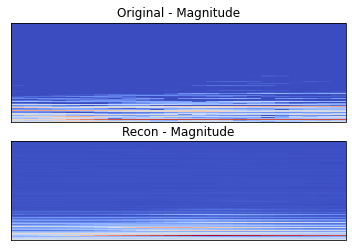

In [ ]:
k = np.random.randint(0,len(xm_data))
#k = 0
    
xxm, xxp = postprocess(xm_data[k], xp_data[k], mscaler, pscaler)
yym, yyp = postprocess(ymag[k], yphi[k] if use_phase else None, mscaler, pscaler)

plt.subplot(221 if use_phase else 211)
show_spectrogram(xxm)
plt.title('Original - Magnitude')
if use_phase:
    plt.subplot(222)
    show_spectrogram(xxp)
    plt.title('Original - Phase')

plt.subplot(223 if use_phase else 212)
show_spectrogram(yym)
plt.title('Recon - Magnitude')
if use_phase:
    plt.subplot(224)
    show_spectrogram(yyp)
    plt.title('Recon - Phase')

print('original clip:')
display(IPython.display.Audio(data=audio_recon(xxm,xxp if feature is not 'mel' else None), rate=sr))
print('reconstructed clip:')
display(IPython.display.Audio(data=audio_recon(yym,yyp if use_phase else None), rate=sr))


## Encoding-Decoding based Generation 
Up till now the VAE model was trained to reproduce individual music blocks (bars or longer) and generate new improvisation by random sampling from the latent space z.

Now we use a different midi file to create a sequence of latent variables z and model it with VMO
We also add a bit-rate control / data reduction of the z sequence


In [ ]:
# Load a single test file
#q = song_file_1
q_df = df_4#get_song(q)
q_mag, _, q_mscaler, _  = preprocess(q_df)


In [ ]:
ref_audio = np.concatenate(q_df.Wave)
display(IPython.display.Audio(data=ref_audio, rate=sr))

In [ ]:
def get_power(x, eps=0, thresh=-80): #1e-12
    S = librosa.stft((x-np.mean(x))/np.sqrt((x**2).sum()), 2048)
    #S = librosa.stft(x, 2048)
    LS = 20*np.log10(np.abs(S) + eps)
    LSav = np.mean(LS, axis=1)
    ind = np.nonzero(LSav < thresh)
    LS[ind,:] = thresh
    return LS

def compute_log_distortion(x_hr, x_pr):
    min_len = min(len(x_hr), len(x_pr))
    LS1 = get_power(x_hr[:min_len])
    LS2 = get_power(x_pr[:min_len])
    lsd = (LS1-LS2)**2
    log_distortion = np.mean(np.sqrt(np.mean(lsd, axis=0)))
    log_s1 = np.mean(np.sqrt(np.mean(LS1**2, axis=0)))
    log_s2 = np.mean(np.sqrt(np.mean(LS2**2, axis=0)))
    return log_distortion, log_s1, log_s2, log_distortion/log_s1


### Baseline STFT-Griffin Lim Results

In [ ]:
S_o, _ = postprocess(np.concatenate(q_mag, axis=1), None, q_mscaler, None)
show_spectrogram(S_o)
baseline_audio = audio_recon(S_o, None)
display(IPython.display.Audio(data=baseline_audio, rate=sr))
#sf.write('bach_847MINp_align_baseline.wav', baseline_audio, sr)

In [ ]:
ref = librosa.resample(ref_audio, sr, 16000)
base = librosa.resample(baseline_audio, sr, 16000)
#print('PESQ: ', pesq(16000, ref, base, 'wb'))
print('LSD: ', compute_log_distortion(ref, base))

LSD:  (2.8025615, 77.608315, 77.393166, 0.036111616)


### Encoder-Decoder results

In [ ]:
# Encode the VAE on query
zq_mu, zq_logvar, zq_sample = encoder.predict(q_mag)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


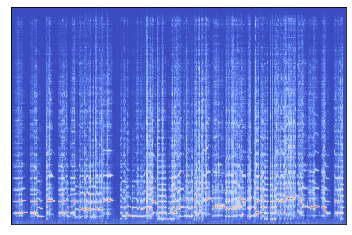

In [ ]:
# Decode with the z from query and evaluate quality
samples = decoder.predict(zq_sample)
S_d, _ = postprocess(np.concatenate(samples, axis=1), None, q_mscaler, None)
show_spectrogram(S_d)
vae_audio = audio_recon(S_d, None)
display(IPython.display.Audio(data=vae_audio, rate=sr))
#sf.write('bach_847MINp_align_vae.wav', vae_audio, sr)

In [ ]:
ref = librosa.resample(ref_audio, sr, 16000)
ed_audio = librosa.resample(vae_audio, sr, 16000)
#print('PESQ: ', pesq(16000, ref, ed_audio, 'wb'))
print('LSD: ', compute_log_distortion(ref, ed_audio))

LSD:  (8.20145, 75.74829, 70.64053, 0.10827241)


# VMO

In [ ]:
import vmo_copy
r = (0., 2.0, 0.01)
ideal_t = vmo_copy.find_threshold(zq_sample, r = r, dim=zq_sample.shape[1])
best_zq_oracle = vmo_copy.build_oracle(zq_sample, flag = 'a', threshold = ideal_t[0][1], dim=zq_sample.shape[1])

In [ ]:
# Pickle vmo results to generate figures later
import pickle
songs = ['bach', 'nanguan', 'shakuhachi', 'telemanF', 'telemanR']
features = ['vae_all', 'vae_self', 'vae_exclude']
song = 'telemanR'
config = 'vae_exclude'
pickle_file = '%s_%s_vmo.pkl'%(song,config)
with open(pickle_file, 'wb') as f:
    pickle.dump(zq_sample, f)
    pickle.dump(ideal_t, f)
    pickle.dump(best_zq_oracle, f)
!cp {pickle_file} /content/drive/'My Drive'/'Colab Notebooks'/InfoSense/models/{pickle_file}

In [ ]:
import pickle
with open('models/bach_all_vmo.pkl', 'rb') as f:
    zq_sample = pickle.load(f)
    ideal_t = pickle.load(f)
    best_zq_oracle = pickle.load(f)

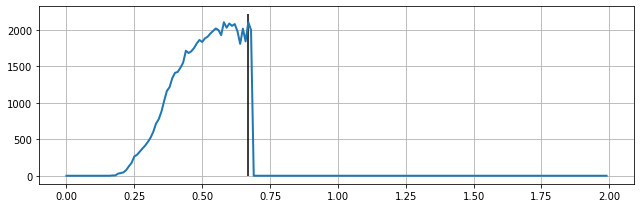

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

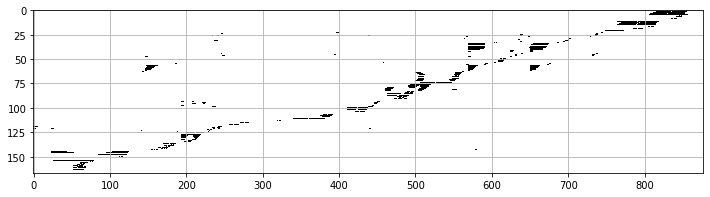

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Nanguan - exclude

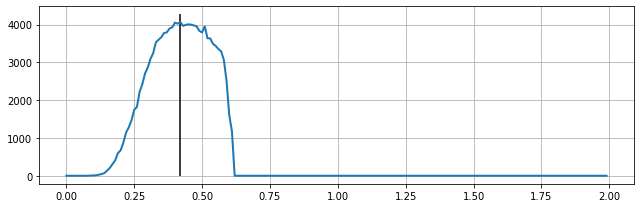

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

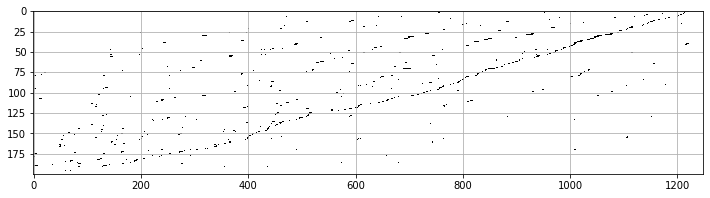

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Telemann - exclude

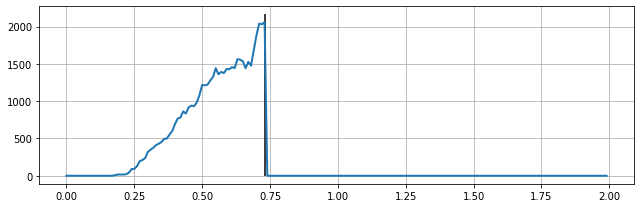

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

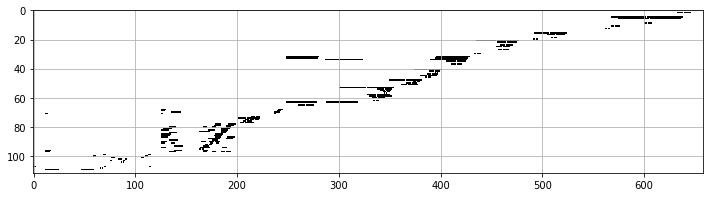

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Shakuhachi - exclude

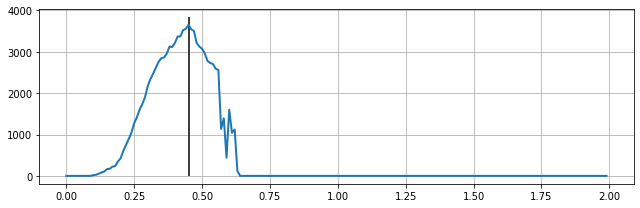

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

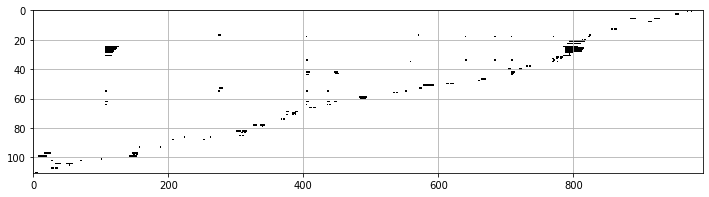

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Bach - exclude

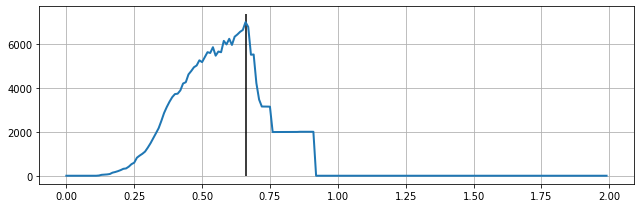

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

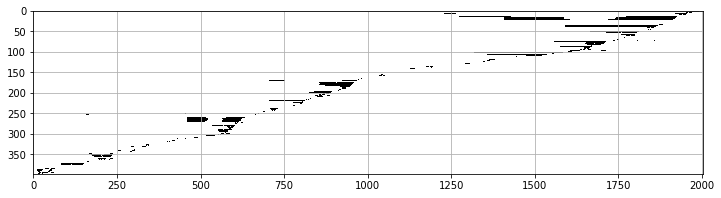

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Nanguan - all

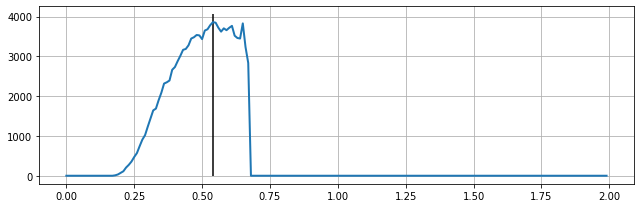

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

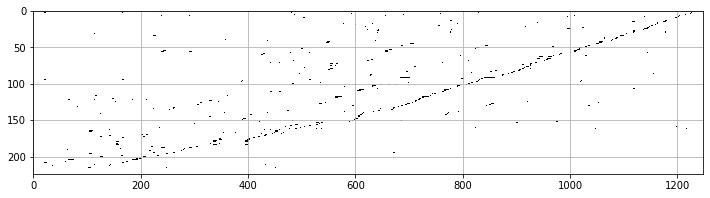

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Telemann - all

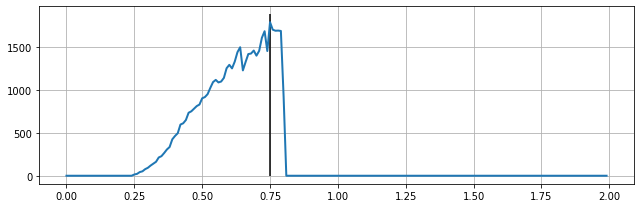

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

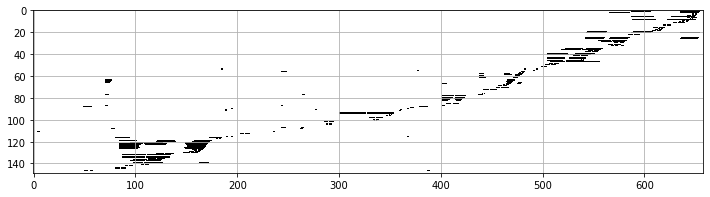

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Shakuhachi - all

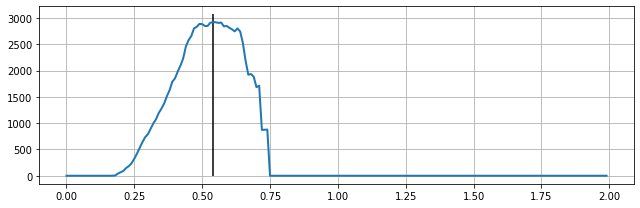

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

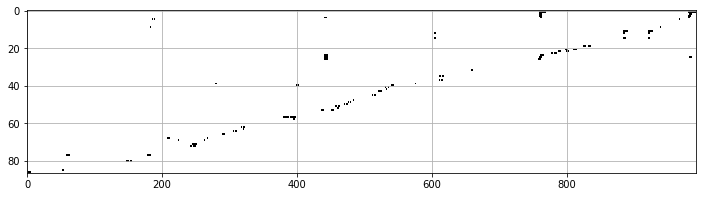

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Bach - all

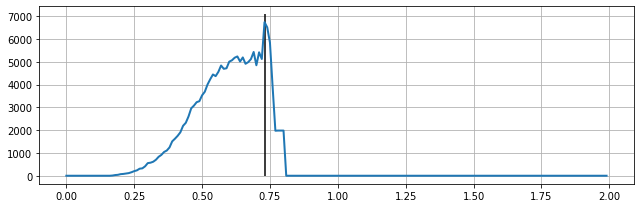

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

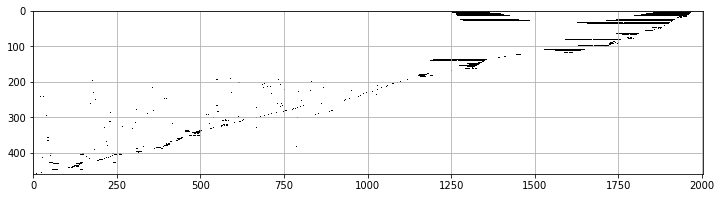

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')

##Nanguan Dongxiao

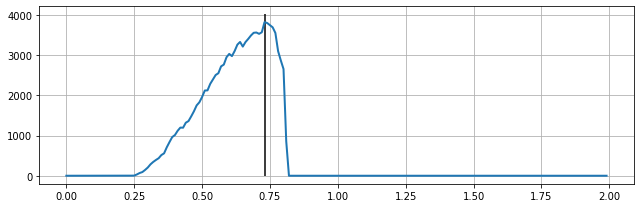

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

Text(0, 0.5, 'Pattern Index (Chroma)')

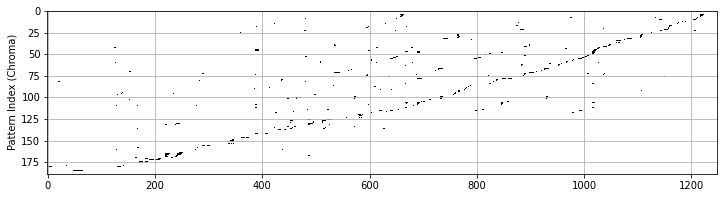

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')
plt.ylabel('Pattern Index (Chroma)')

##Telemann Flute

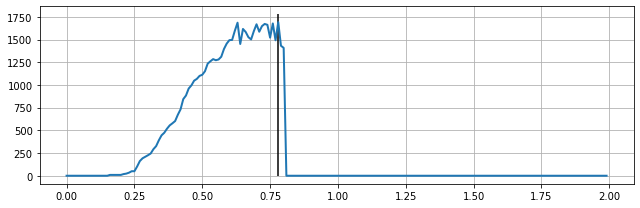

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

Text(0, 0.5, 'Pattern Index (Chroma)')

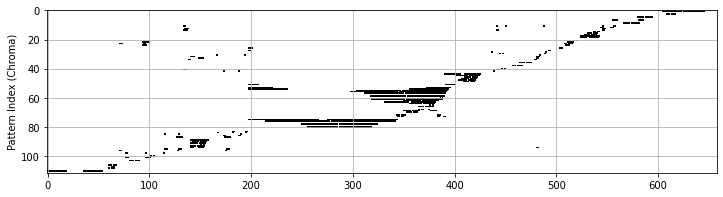

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')
plt.ylabel('Pattern Index (Chroma)')

##Shakuhachi Flute

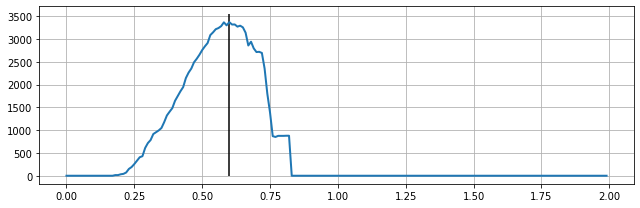

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

Text(0, 0.5, 'Pattern Index (Chroma)')

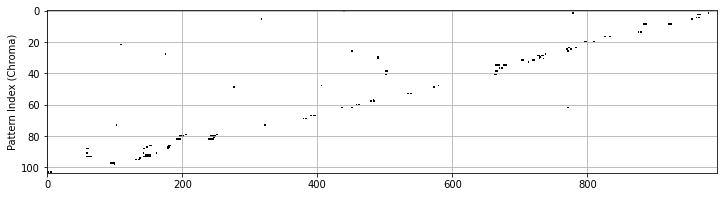

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')
plt.ylabel('Pattern Index (Chroma)')

##Bach Flute

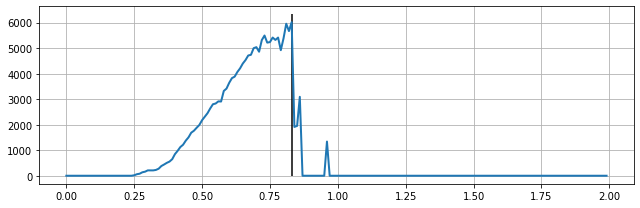

In [ ]:
x_t = np.array([t[1] for t in ideal_t[1]])
y_t = [t[0] for t in ideal_t[1]] 
plt.figure(figsize = (9,3))
plt.plot(x_t, y_t, linewidth = 2)
ymin, ymax = plt.ylim()
plt.vlines(ideal_t[0][1], 0, ymax)
plt.grid('on')
plt.tight_layout()

Text(0, 0.5, 'Pattern Index (Chroma)')

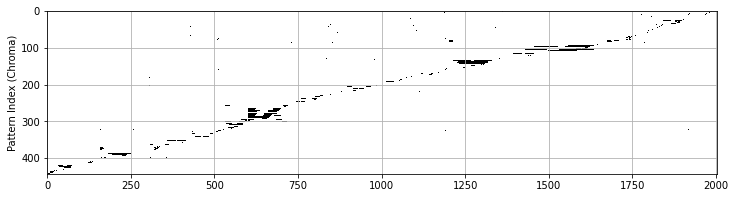

In [ ]:
import vmo_copy.analysis as van

pattern = van.find_repeated_patterns(best_zq_oracle, lower=2)
pattern_mat = np.zeros((len(pattern), best_zq_oracle.n_states-1))
for i,p in enumerate(pattern):
    length = p[1]
    for s in p[0]:
        pattern_mat[i][s-length:s-1] = 1
plt.figure(figsize = (12,3))
plt.imshow(pattern_mat, interpolation = 'nearest', aspect = 'auto', cmap = 'Greys')
plt.grid('on')
plt.ylabel('Pattern Index (Chroma)')

In [ ]:
%rm -rf vmo_copy

## old experiments

In [ ]:
import vmo_copy.analysis as van
import vmo_copy.generate as vge

bo = best_zq_oracle

b, kend, ktrace = vge.generate(bo, 120, 0.87, 1, LRS=2, weight='weight')
seq = np.array([zq_sample[i-1] for i in b])

ModuleNotFoundError: ignored

In [ ]:
samples = decoder.predict(seq) #this is reconstructio (decoding) from improvised latent sequence
S_d, _ = postprocess(np.concatenate(samples, axis=1), None, q_mscaler, None)
show_spectrogram(S_d)
vmo_audio = audio_recon(S_d, None)
display(IPython.display.Audio(data=vmo_audio, rate=sr))
sf.write('bach_847MINp_align_vmo.wav', vae_audio, sr)

NameError: ignored


0it [00:00, ?it/s]
1it [00:01,  1.72s/it]
2it [00:03,  1.74s/it]
3it [00:05,  1.74s/it]
4it [00:07,  1.76s/it]
5it [00:08,  1.80s/it]
6it [00:10,  1.82s/it]
7it [00:12,  1.83s/it]
8it [00:14,  1.87s/it]
9it [00:16,  1.88s/it]
10it [00:18,  1.88s/it]
11it [00:20,  1.89s/it]
12it [00:22,  1.90s/it]
13it [00:24,  1.89s/it]
14it [00:25,  1.88s/it]
15it [00:27,  1.88s/it]
16it [00:29,  1.88s/it]
17it [00:31,  1.89s/it]
18it [00:33,  1.88s/it]
19it [00:35,  1.88s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

20it [00:37,  1.90s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

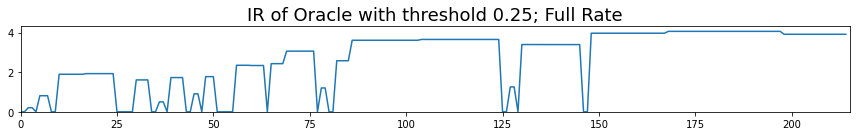

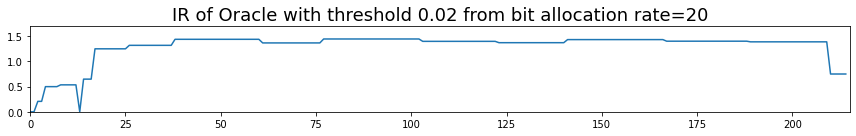

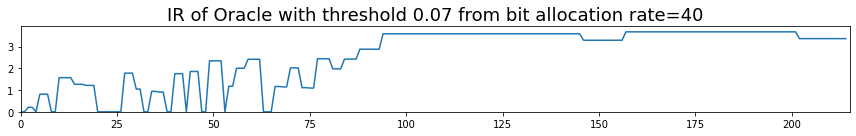

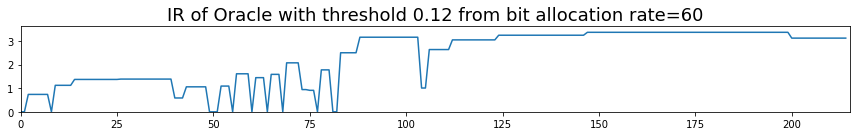

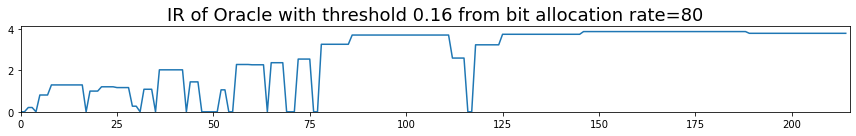

...

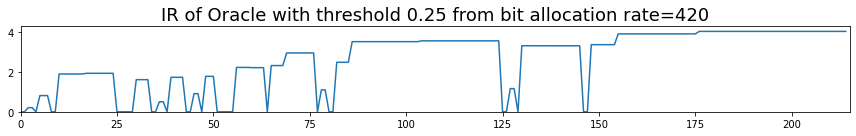

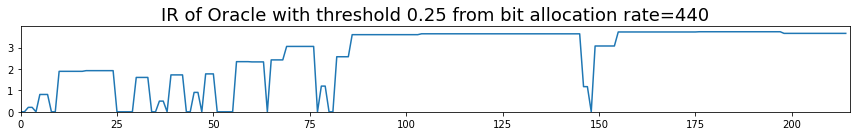

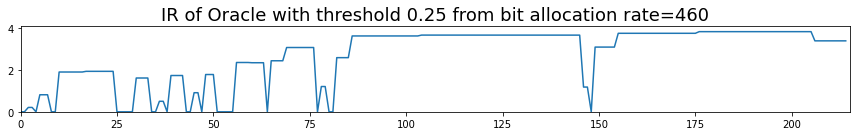

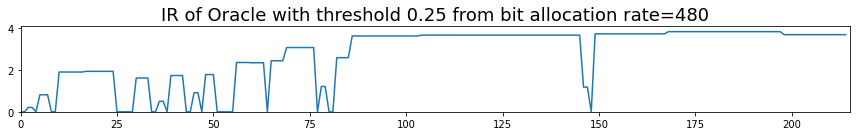

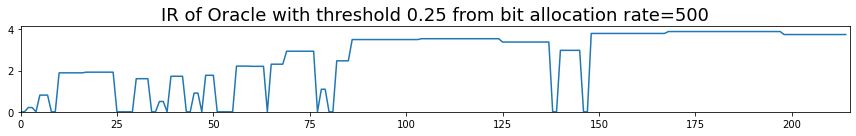

In [ ]:
Rates = np.linspace(0,500,26, dtype=np.int)[1:]

ideal_t = vmo_copy.find_threshold(zq_sample, r = r, dim=zq_sample.shape[1])
best_zq_oracle = vmo_copy.build_oracle(zq_sample, flag = 'a', threshold = ideal_t[0][1], dim=zq_sample.shape[1])
ir, h0, h1 = best_zq_oracle.IR()
plt.figure(figsize=(12,2))
plt.plot(ir)
plt.ylim((0, max(ir) + 0.25))
plt.xlim((0, len(ir)))
plt.title('IR of Oracle with threshold' + ' ' + str(ideal_t[0][1]) + '; Full Rate', fontsize=18)

plt.tight_layout()
for i, R in tqdm(enumerate(Rates)):
    bit_alloc = reverse_water_filling(zq_sig2,R)  #computer bit allocation for that song
    quant_zq = Berger(zq_sample, bit_alloc)  #quantize z with limited bit-rate
    ideal_t = vmo_copy.find_threshold(quant_zq, r = r, dim=quant_zq.shape[1])
    best_zq_oracle = vmo_copy.build_oracle(quant_zq, flag = 'a', threshold = ideal_t[0][1], dim=quant_zq.shape[1])

    ir, h0, h1 = best_zq_oracle.IR()
    plt.figure(figsize=(12,2))
    plt.plot(ir)
    plt.ylim((0, max(ir) + 0.25))
    plt.xlim((0, len(ir)))
    plt.title('IR of Oracle with threshold' + ' ' + str(ideal_t[0][1]) + ' from bit allocation rate=' + str(R), fontsize=18)
    plt.tight_layout()

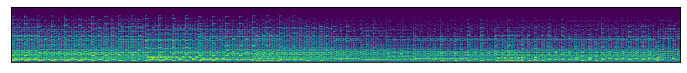

In [ ]:
plt.figure(figsize=(12,2))
plt.imshow(S_o[-600::-1,:], interpolation='nearest')
plt.gca().get_xaxis().set_visible(False)
plt.gca().get_yaxis().set_visible(False)
#plt.ylim((0, max(ir) + 0.25))
#plt.xlim((0, len(ir)))
#plt.title('IR of Oracle with threshold' + ' ' + str(ideal_t[0][1]) + ' from bit allocation rate=' + str(R), fontsize=18)
#plt.tight_layout()

In [ ]:
import vmo_copy
r = (0., 2.0, 0.01)

num_songs = len(df_test.Magnitude)
# Average rate comparison across multiple songs
Rates = np.linspace(0,1000,21, dtype=np.int)[1:]
files = glob.glob(('{}/*.wav*').format('LABROSA-APT/test/WAV'))
num_songs = len(files)
IR = np.zeros((len(Rates),num_songs))
IT = np.zeros((len(Rates),num_songs))

for j, f in enumerate(files):
    print('Processing song ',j)
    q_df = get_song(q)
    q_mag, _, q_mscaler, _  = preprocess(q_df)
    ref_audio = librosa.resample(np.concatenate(q_df.Wave), sr, 16000)
    
    zq_mu, zq_logvar, zq_sample = encoder.predict(q_mag)
    zq_sig2 = np.mean(np.exp(zq_logvar), axis = 0)
    for i, R in enumerate(Rates):
        print(i,R)
        bit_alloc = reverse_water_filling(zq_sig2,R)  #computer bit allocation for that song
        quant_zq = Berger(zq_sample, bit_alloc)  #quantize z with limited bit-rate
        ideal_t = vmo_copy.find_threshold(quant_zq, r = r, dim=quant_zq.shape[1])
        IT[i,j] = ideal_t[0][1]
        IR[i,j] = ideal_t[0][0]

Processing song  0
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  1
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  2
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  3
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  4
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  5
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700
14 750
15 800
16 850
17 900
18 950
19 1000
Processing song  6
0 50
1 100
2 150
3 200
4 250
5 300
6 350
7 400
8 450
9 500
10 550
11 600
12 650
13 700


10


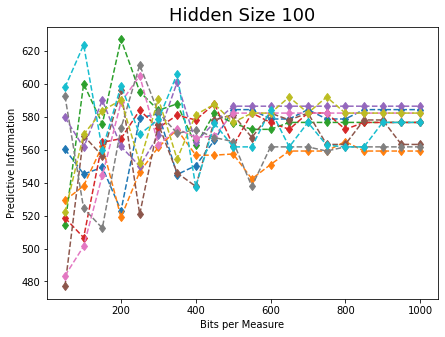

In [ ]:
print(num_songs)
for k in range(num_songs):
    #if all(IR[:,k] != 0):
        #print('OK',k)
    plt.plot(Rates,IR[:,k],'d--')

#plt.plot(Rates,np.mean(IR,1))
#plt.yscale('log')
   
ttl = 'Hidden Size '+str(latent_dim)
    
#num_timesteps  = 16 #64 #32 #16 #This is the number of timesteps that we will create at a time  (16 = one bar)
#n_visible      = 2*note_range*num_timesteps #This is the size of the visible layer. 
#n_hidden       = 3000 #500  #50 #This is the size of the hidden layer
#plt.rcParams.update({'font.size': 12})

SMALL_SIZE = 12 #8
MEDIUM_SIZE = 16 #10
BIGGER_SIZE = 18

#plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
#plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
#plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

fig = plt.gcf()
plt.title(ttl)
plt.ylabel('Predictive Information')
plt.xlabel('Bits per Measure')
fig.set_size_inches(7, 5.0)

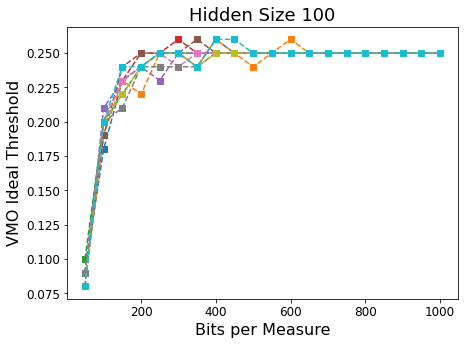

In [ ]:
for k in range(num_songs):
    #if all(IT[:,k] != 0):
#        print('OK',k)
    plt.plot(Rates,IT[:,k],'s--')
        
ttl = 'Hidden Size '+str(latent_dim)
    
#num_timesteps  = 16 #64 #32 #16 #This is the number of timesteps that we will create at a time  (16 = one bar)
#n_visible      = 2*note_range*num_timesteps #This is the size of the visible layer. 
#n_hidden       = 3000 #500  #50 #This is the size of the hidden layer
#plt.rcParams.update({'font.size': 12})

SMALL_SIZE = 12 #8
MEDIUM_SIZE = 16 #10
BIGGER_SIZE = 18

#plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
#plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
#plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

fig = plt.gcf()
plt.title(ttl)
plt.ylabel('VMO Ideal Threshold')
plt.xlabel('Bits per Measure')
fig.set_size_inches(7, 5.0)